**Lab 1 Iris dataset**

In [126]:
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt

In [101]:
df = pd.read_excel('my_iris.xlsx')
df.head()

,Unnamed: 0,sepal_depth,sepal_diameter,petal_depth,petal_diameter,sepal length,sepal width,petal length,petal width,target
0,0,NaN,NaN,NaN,NaN,10.2,-7.0,5.6,-0.8,Iris-setosa
1,1,4.9,3.0,1.4,0.2,9.8,-6.0,5.6,-0.8,Iris-setosa
2,2,4.7,3.2,NaN,NaN,9.4,-6.4,5.2,-0.8,Iris-setosa
3,3,4.6,NaN,1.5,NaN,9.2,-6.2,6.0,-0.8,Iris-setosa
4,4,NaN,3.6,NaN,NaN,10.0,-7.2,5.6,-0.8,Iris-setosa


In [102]:
df.drop(['Unnamed: 0'], axis = 1, inplace = True)


In [103]:
df.isnull().sum()

sepal_depth       20
sepal_diameter    20
petal_depth       20
petal_diameter    50
sepal length       0
sepal width        0
petal length       0
petal width        0
target             0
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


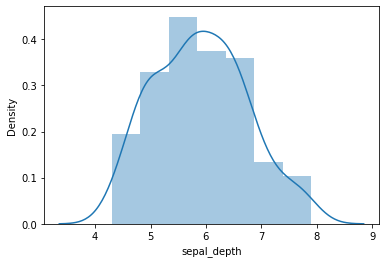

In [104]:
sns.distplot(df.sepal_depth)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


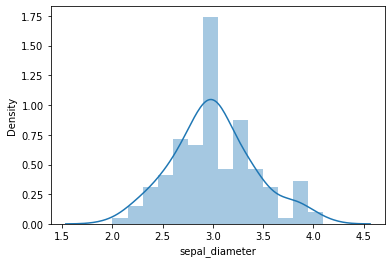

In [105]:
sns.distplot(df.sepal_diameter)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


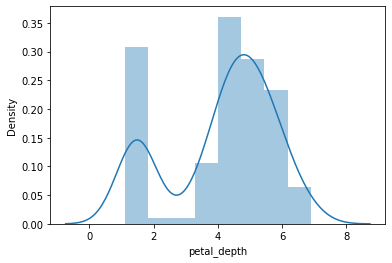

In [106]:
sns.distplot(df.petal_depth)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


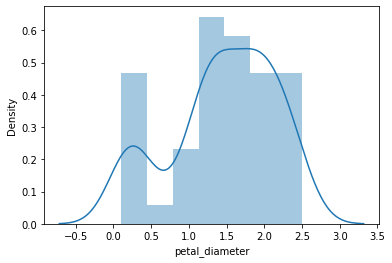

In [107]:
sns.distplot(df.petal_diameter)

In [108]:
df['sepal_depth'] = df['sepal_depth'].fillna(df['sepal_depth'].mean())
df['sepal_diameter'] = df['sepal_diameter'].fillna(df['sepal_diameter'].mean())
df['petal_depth'] = df['petal_depth'].fillna(df['petal_depth'].median())
df['petal_diameter'] = df['petal_diameter'].fillna(df['petal_diameter'].median())

In [109]:
df.corr()

,sepal_depth,sepal_diameter,petal_depth,petal_diameter,sepal length,sepal width,petal length,petal width
sepal_depth,1.000000,0.010800,0.765257,0.658157,0.938352,0.043935,0.796027,-0.743394
sepal_diameter,0.010800,1.000000,-0.125830,-0.040122,-0.045702,-0.879864,-0.302132,0.238021
petal_depth,0.765257,-0.125830,1.000000,0.779606,0.749898,0.241148,0.806921,-0.772129
petal_diameter,0.658157,-0.040122,0.779606,1.000000,0.613616,0.028974,0.655982,-0.712379
sepal length,0.938352,-0.045702,0.749898,0.613616,1.000000,0.109369,0.871754,-0.817954
sepal width,0.043935,-0.879864,0.241148,0.028974,0.109369,1.000000,0.420516,-0.356544
petal length,0.796027,-0.302132,0.806921,0.655982,0.871754,0.420516,1.000000,-0.962757
petal width,-0.743394,0.238021,-0.772129,-0.712379,-0.817954,-0.356544,-0.962757,1.000000


In [110]:
df.drop(['sepal_depth', 'sepal_diameter', 'sepal length', 'petal length', 'petal_depth', 'petal_diameter'], axis = 1, inplace = True)

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sepal width  150 non-null    float64
 1   petal width  150 non-null    float64
 2   target       150 non-null    object 
dtypes: float64(2), object(1)
memory usage: 3.6+ KB


In [112]:
y = df['target']
X = df[['sepal width', 'petal width']]

In [113]:
print(y.shape)
print(X.shape)

(150,)
(150, 2)


In [114]:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=2)
print(X.shape, X_train.shape, X_test.shape)

(150, 2) (120, 2) (30, 2)


In [115]:
model = LogisticRegression()
model.fit(X_train, Y_train)

LogisticRegression()

In [116]:
y_pred = model.predict(X_test)
y_pred

array(['Iris-setosa', 'Iris-setosa', 'Iris-virginica', 'Iris-setosa',
       'Iris-setosa', 'Iris-versicolor', 'Iris-setosa', 'Iris-virginica',
       'Iris-virginica', 'Iris-setosa', 'Iris-setosa', 'Iris-setosa',
       'Iris-setosa', 'Iris-setosa', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-setosa', 'Iris-versicolor', 'Iris-virginica',
       'Iris-versicolor', 'Iris-virginica', 'Iris-versicolor',
       'Iris-virginica', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-setosa', 'Iris-setosa', 'Iris-virginica', 'Iris-setosa',
       'Iris-virginica'], dtype=object)

In [117]:
print('Accuracy: %.3f' % accuracy_score(Y_test, y_pred))

Accuracy: 0.933


**Precision**

In [118]:
print("Precision Score : ",precision_score(Y_test, y_pred, 
                                           pos_label='positive',
                                           average='micro'))

Precision Score :  0.9333333333333333


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,


**Recall**

In [119]:
print("Recall Score : ",recall_score(Y_test, y_pred, 
                                           pos_label='positive',
                                           average='micro'))

Recall Score :  0.9333333333333333


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,


In [120]:
print("F1 Score : ",f1_score(Y_test, y_pred, 
                                           pos_label='positive',
                                           average='micro'))

F1 Score :  0.9333333333333333


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,


**Confusion Matrix**

In [121]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(Y_test, y_pred)
print(cf_matrix)

[[14  0  0]
 [ 0  7  1]
 [ 0  1  7]]


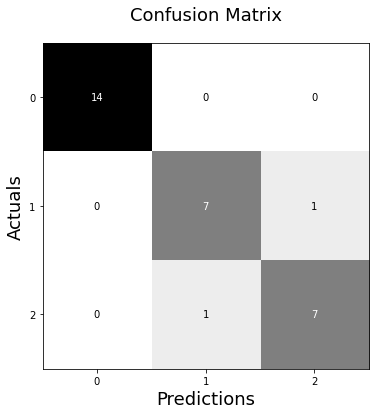

In [127]:
#ploting confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=cf_matrix, figsize=(6, 6), cmap=plt.cm.binary)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

**Lab 2 Image Processing**

In [134]:
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import json
from PIL import Image

In [133]:
images = []
for i in range(11):
    if i != 10:
        cat = 'cat.' + str(i) + '.jpg'
        images.append(cat)
    dog = 'dog.' + str(i) + '.jpg'
    images.append(dog)

In [171]:
filename = r"dog.8.jpg"
image = Image.open(filename)
with open('mydata.json', 'w') as f:
    json.dump((np.array(image).tolist()), f)

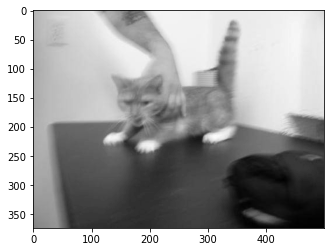

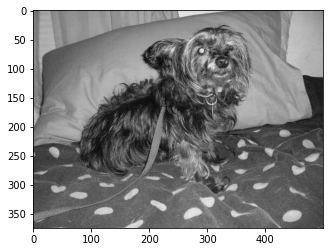

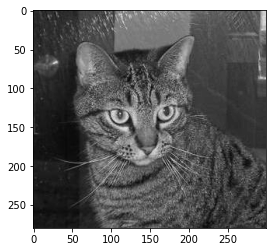

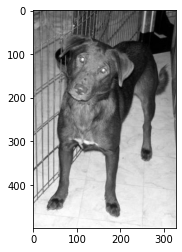

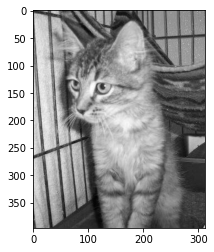

...

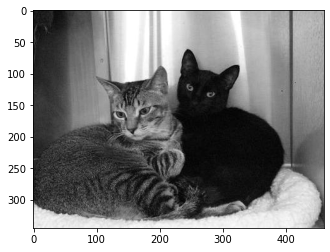

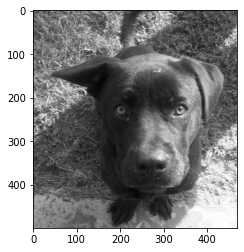

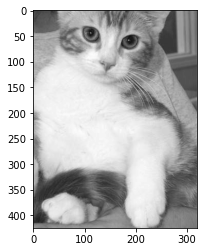

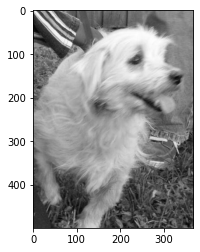

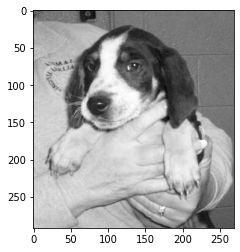

In [145]:
def GrayScale(image):
  image = mpimg.imread(image)
  R, G, B = image[:,:,0], image[:,:,1], image[:,:,2]
  imgGray = 0.3 * R + 0.59 * G + 0.11 * B
  plt.imshow(imgGray, cmap='gray')
  plt.show()
  return imgGray

for image in images:
  GrayScale(image)
# image = 'dog.9.jpg'
# image_array = mpimg.imread(image)
# print(image_array.shape)
# plt.imshow(image_array, cmap='gray')


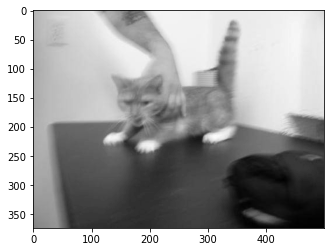

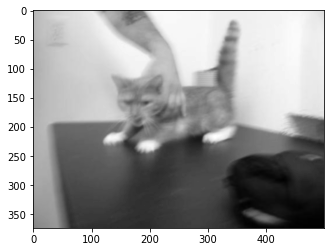

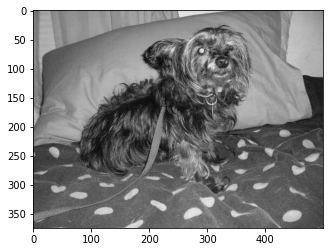

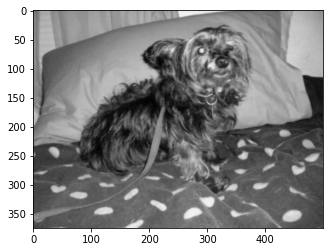

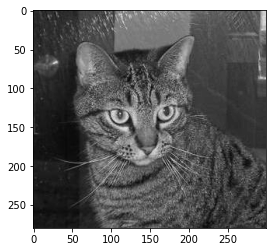

...

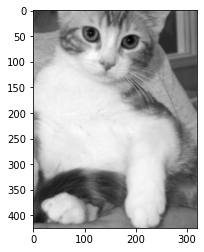

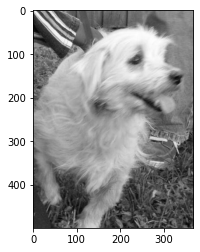

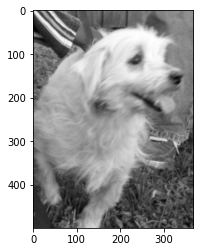

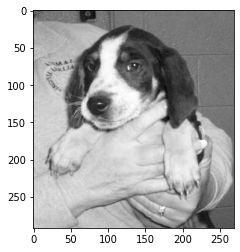

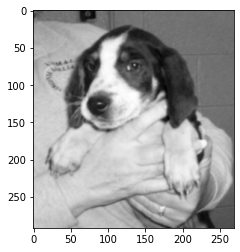

In [168]:
def correlation(image):
  filter = [[1, 2, 1], [2, 4, 2], [1, 2, 1]]
  filter = np.array(filter)
  image = GrayScale(image)
  rows = len(image) - 1
  columns = len(image[0]) - 1

  for i in range(1, rows):
    for j in range(1, columns):
      first_row = image[i-1][j-1]*filter[0][0] + image[i][j-1]*filter[1][0] + image[i+1][j-1]*filter[2][0]
      second_row = image[i-1][j]*filter[0][1] + image[i][j]*filter[1][1] + image[i+1][j]*filter[2][1]
      third_row = image[i-1][j+1]*filter[0][2] + image[i][j+1]*filter[1][2] + image[i+1][j+1]*filter[2][2]
      value = (first_row + second_row + third_row)/16
      image[i][j]=value
  plt.imshow(image,cmap='gray')
  plt.show()

for image in images:
  correlation(image)
# print(len(image[0]))
# print(image.shape)
# print(rows)


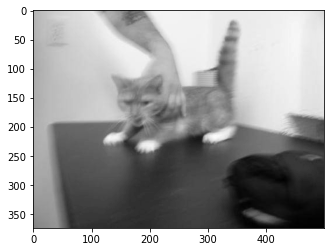

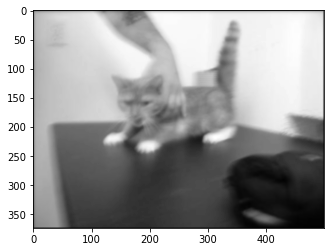

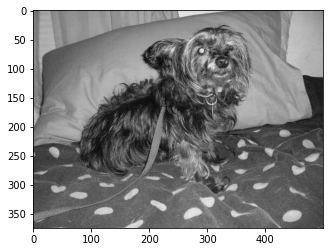

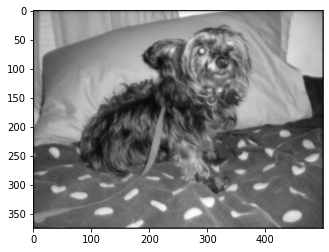

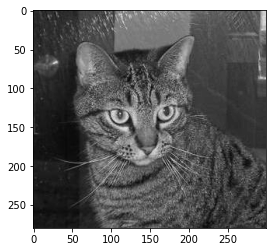

...

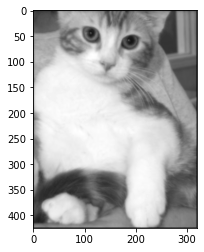

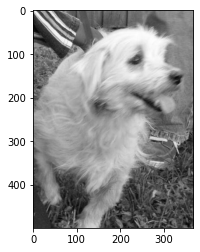

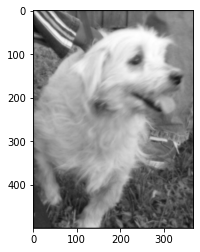

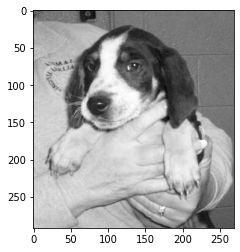

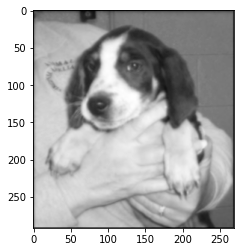

In [169]:
def convolution(image):
  #function to gray scale the image
  imgGray = GrayScale(image)
  #making a filter 3x3 filter for convolution
  filter = [[1, 2, 1], [2, 4, 2], [1, 2, 1]]
  filter = np.array(filter)
  kernelTranspose = np.array(filter.T.tolist())
  #multiplying and summation
  for i in range(1, len(imgGray) - 1):
    for j in range(1, len(imgGray[0]) - 1):
      first_row = imgGray[i-1][j-1]*kernelTranspose[0][0] + imgGray[i-1][j]*kernelTranspose[0][1] + imgGray[i-1][j+1]*kernelTranspose[0][2]
      second_row = imgGray[i][j-1]*kernelTranspose[1][0] + imgGray[i][j]*kernelTranspose[1][1] + imgGray[i][j+1]*kernelTranspose[1][2]
      third_row = imgGray[i+1][j-1]*kernelTranspose[2][0] + imgGray[i+1][j]*kernelTranspose[2][1] + imgGray[i+1][j+1]*kernelTranspose[2][2]
      imgGray[i][j] = (1/9)*(first_row + second_row + third_row)
  #displaying the resulting image
  plt.imshow(imgGray, cmap='gray')
  plt.show()

for image in images:
  convolution(image)

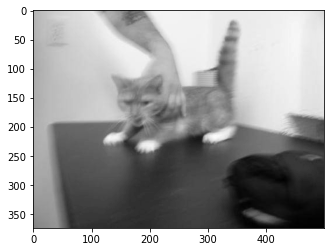

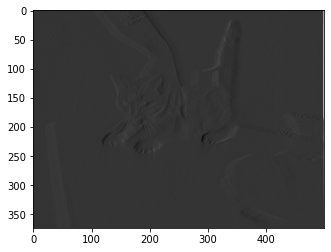

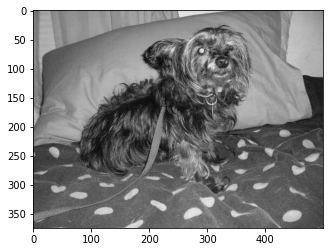

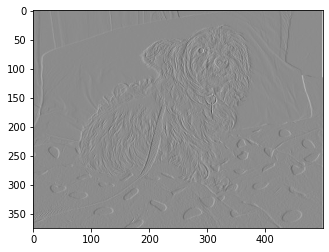

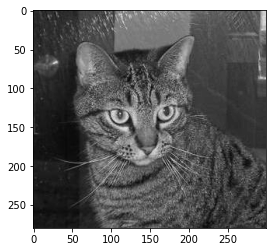

...

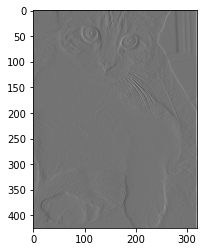

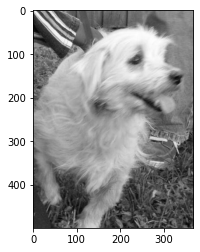

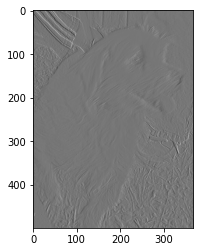

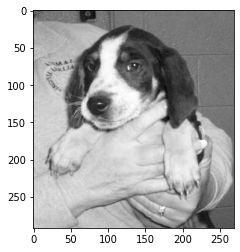

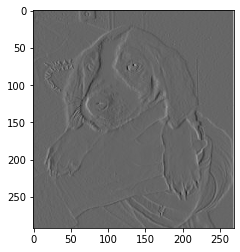

In [172]:
def first_derivative(image):
    imgGray = GrayScale(image)
    fder_filter=[1, -1]
    fder=imgGray
    rows=len(imgGray)-1
    cols=len((imgGray[0]))-1
    for i in range (0,rows+1):
      for j in range (0,cols):
        fder[i][j]=fder_filter[0]*imgGray[i][j]
        fder[i][j]+=fder_filter[1]*imgGray[i][j+1]
    plt.imshow(fder,cmap='gray')
    plt.show()
for image in images:
  first_derivative(image)

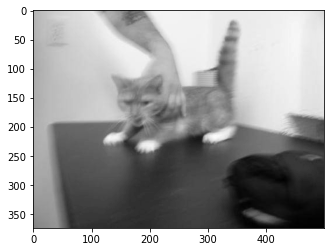

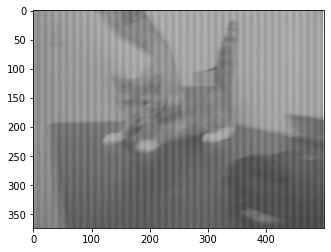

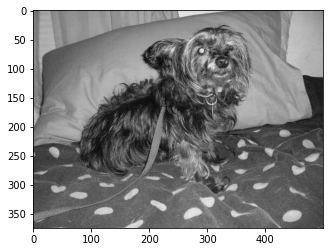

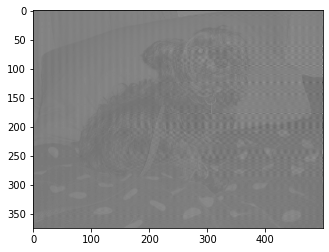

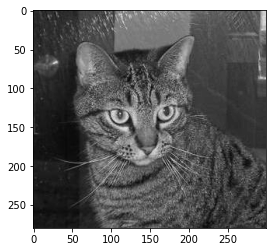

...

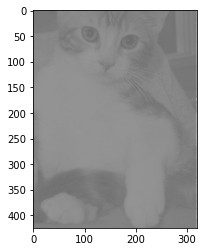

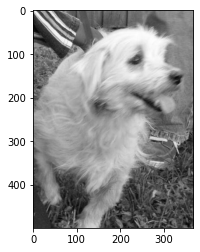

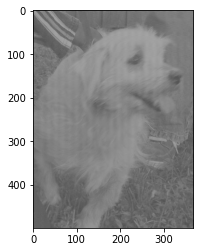

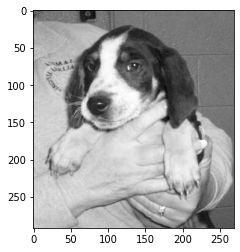

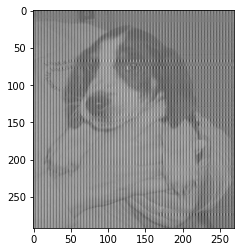

In [173]:
def second_derivative(image):
  imgGray = GrayScale(image)
  sder_filter=[1,-2, 1]
  sder=imgGray
  rows=len(imgGray)-1
  cols=len((imgGray[0]))-1
  for i in range (0,rows+1):
    for j in range (1,cols):
      sder[i][j]=sder_filter[0]*imgGray[i][j-1]
      sder[i][j]+=sder_filter[1]*imgGray[i][j]
      sder[i][j]+=sder_filter[2]*imgGray[i][j+1]
  plt.imshow(sder,cmap='gray')
  plt.show()
for image in images:
  second_derivative(image)

**Lab 4 Text data**

In [174]:
import pandas as pd
import re
from nltk.stem import PorterStemmer
import nltk
import numpy as np
import pprint
from collections import Counter
import string
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('omw-1.4')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [177]:
df = pd.read_csv("labeled_data.csv")
df

,Unnamed: 0,count,hate_speech,offensive_language,neither,class,tweet
0,0,3,0,0,3,2,!!! RT @mayasolovely: As a woman you shouldn't...
1,1,3,0,3,0,1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,2,3,0,3,0,1,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,3,3,0,2,1,1,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,4,6,0,6,0,1,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...
...,...,...,...,...,...,...,...
24778,25291,3,0,2,1,1,you's a muthaf***in lie &#8220;@LifeAsKing: @2...
24779,25292,3,0,1,2,2,"you've gone and broke the wrong heart baby, an..."
24780,25294,3,0,3,0,1,young buck wanna eat!!.. dat nigguh like I ain...
24781,25295,6,0,6,0,1,youu got wild bitches tellin you lies


In [178]:
df.drop(['Unnamed: 0', 'count', 'hate_speech', 'offensive_language', 'neither', 'class'], axis=1, inplace=True)
df

,tweet
0,!!! RT @mayasolovely: As a woman you shouldn't...
1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...
...,...
24778,you's a muthaf***in lie &#8220;@LifeAsKing: @2...
24779,"you've gone and broke the wrong heart baby, an..."
24780,young buck wanna eat!!.. dat nigguh like I ain...
24781,youu got wild bitches tellin you lies


**Removing stop words**

In [179]:
#remove stopwords
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
stop_words.add('subject')
stop_words.add('http')
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])
df['tweet'] = df['tweet'].apply(lambda x: remove_stopwords(x))

**Removing Words with digits**

In [180]:
#remove words and digits
df['tweet'] = df['tweet'].apply(lambda x: re.sub('W*dw*','',x))

**Making all data lower case**

In [181]:
df['tweet'] = df['tweet'].str.lower()

**Remove Punctuations**

In [182]:
#remove punctuation
df['tweet'] = df['tweet'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '' , x))

**Stemming**

In [183]:
#stemming
stemmer = PorterStemmer()
def stem_words(text):
    return " ".join([stemmer.stem(word) for word in text.split()])
df["tweet"] = df["tweet"].apply(lambda x: stem_words(x))

**Lemmatization**

In [184]:
#Lemmatization
lemmatizer = WordNetLemmatizer()
def lemmatize_words(text):
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])
df["tweet"] = df["tweet"].apply(lambda text: lemmatize_words(text))

In [185]:
#dataframe after preporcessing
df

,tweet
0,rt mayasolov a woman complain clean hous amp m...
1,rt mleew17 boy at coltyga n ba cuffin at hoe 1...
2,rt urkinofbran dawg rt 80sbaby4lif you ever fu...
3,rt cganerson vivabas look like tranni
4,rt shenikarobert the shit hear might true migh...
...,...
24778,you muthafin lie 8220lifeask 20pearl coreyeman...
24779,gone broke wrong heart babi rove reneck crazi
24780,young buck wanna eat at nigguh like i aint fuc...
24781,youu got wil bitch tellin lie


In [186]:
# creating bag of words
def create_BOW(temp_data):
    BOW=[] # array to store BOW

    for j in temp_data: # iterating in a row
        temp_dict={} # creating a temporary dictionary record
        for i in j.strip().split(): # iterating over individual words
            if i in temp_dict: # increase counter if already present
                temp_dict[i]=temp_dict[i]+1
            else: # adding to dictionary if not present
                temp_dict[i]=1
        BOW.append(temp_dict) # adding the dictionary record to array
    return BOW # returning array

In [191]:
BOW=create_BOW(df.tweet) # creating Bag Of Words
for w in BOW:
  print(W)

{'rt': 1, 'mayasolov': 1, 'a': 1, 'woman': 1, 'complain': 1, 'clean': 1, 'hous': 1, 'amp': 1, 'man': 1, 'alway': 1, 'take': 1, 'trash': 1, 'out': 1}


In [192]:
# creating TF
def create_tf(arr):
    tf=[] # array to store TF
    for i in range(len(arr)): # iterating over each record
        temp={} # creating a temporary dictionary
        for j in arr[i]: # iterating of each word
            temp[j]=arr[i][j]/len(arr[i]) # calculating TF for each word in BOW
        tf.append(temp) # adding to array of TF
    return tf # returning array

In [193]:
tf = create_tf(BOW) # creating TF from BOW
print(tf[0])

{'rt': 0.07692307692307693, 'mayasolov': 0.07692307692307693, 'a': 0.07692307692307693, 'woman': 0.07692307692307693, 'complain': 0.07692307692307693, 'clean': 0.07692307692307693, 'hous': 0.07692307692307693, 'amp': 0.07692307692307693, 'man': 0.07692307692307693, 'alway': 0.07692307692307693, 'take': 0.07692307692307693, 'trash': 0.07692307692307693, 'out': 0.07692307692307693}


In [194]:
# creating vocabulary
def create_vocab(BOW):
    vocab={} # creating a dictionary 
    for i in BOW:
        for j in i:
            if j in vocab:
                vocab[j]+=1   
            else:
                vocab[j]=1
    return vocab

In [195]:
vocab=create_vocab(BOW)
print(vocab)

{'rt': 7125, 'mayasolov': 1, 'a': 703, 'woman': 246, 'complain': 45, 'clean': 50, 'hous': 126, 'amp': 754, 'man': 540, 'alway': 279, 'take': 377, 'trash': 1093, 'out': 105, 'mleew17': 1, 'boy': 323, 'at': 329, 'coltyga': 1, 'n': 294, 'ba': 546, 'cuffin': 10, 'hoe': 3911, '1st': 37, 'place': 74, 'urkinofbran': 3, 'dawg': 10, '80sbaby4lif': 28, 'you': 1131, 'ever': 254, 'fuck': 2048, 'bitch': 10479, 'start': 229, 'cri': 105, 'confus': 35, 'shit': 1206, 'cganerson': 1, 'vivabas': 5, 'look': 722, 'like': 2604, 'tranni': 54, 'shenikarobert': 1, 'the': 561, 'hear': 142, 'might': 109, 'true': 65, 'faker': 3, 'tol': 143, 'ya': 431, '57361': 1, 'tmaisonx': 2, 'blow': 48, 'meclaim': 1, 'faith': 26, 'someboy': 69, 'still': 465, '128514128514128514': 181, 'brighterday': 3, 'i': 5408, 'sit': 91, 'hate': 521, 'anoth': 170, 'got': 1223, 'much': 217, 'go': 996, 'on': 157, '8220selfiequeenbri': 1, 'caus': 302, 'im': 1882, 'tire': 71, 'big': 231, 'come': 423, 'u': 1175, 'skinni': 44, 'girls8221': 3, 'ge

In [199]:
# creating IDF of entire vocabulary
def create_IDF(BOW,vocab):
    # iterate for each word in all documents
    IDF={} # creating a temporary dictionary
    length=len(BOW) # calculating number of documents
    for i in vocab.keys(): # iterating for each word in vocabulary
        temp=0 # creating a variable for storing count of document
        for j in range(length): # iterating for each record
            if i in BOW[j].keys(): # checking if word is present in document
                temp+=1 # incrementing document count
        IDF[i]=1+np.log(length/temp) # storing IDF for a given word
    return IDF # returning dictionary of IDF values

In [200]:
IDF=create_IDF(BOW,vocab)

In [201]:
# calculating tf-idf
def create_TFIDF(TF,IDF):
    tfidf=[] # creating a temporary array
    for i in range(len(TF)): # iterating for each record
        temp={} # a temporary dictionary for storing tfidf
        for j in TF[i].keys(): # for each key in record (word)
            temp[j]=TF[i][j]*IDF[j] # calculating tf-idf for each word in tf
        tfidf.append(temp) # adding a record to array
    return tfidf

In [203]:
TF_IDF=create_TFIDF(tf,IDF)
TF_IDF

[{'rt': 0.1728114006225972,
  'mayasolov': 0.855224093325432,
  'a': 0.3509658708784577,
  'woman': 0.4317370520998656,
  'complain': 0.5624039018046382,
  'clean': 0.5542992467540361,
  'hous': 0.4832024081753183,
  'amp': 0.3455785265555892,
  'man': 0.37125723643633046,
  'alway': 0.42205395626225,
  'take': 0.39889754044481573,
  'trash': 0.3170178250041597,
  'out': 0.4972271433133148},
 {'rt': 0.20423165528125123,
  'mleew17': 1.010719383020965,
  'boy': 0.48547826272799627,
  'at': 0.9676100840845897,
  'coltyga': 1.010719383020965,
  'n': 0.4940303132629031,
  'ba': 0.43775402158961,
  'cuffin': 0.8013934654760517,
  'hoe': 0.2587604398613728,
  '1st': 0.6824541182351264,
  'place': 0.6194407381842223},
 {'rt': 0.37442470134896055,
  'urkinofbran': 0.8349417437135421,
  'dawg': 0.7346106766863807,
  '80sbaby4lif': 0.6488090585879509,
  'you': 0.6811759561857491,
  'ever': 0.4650482455176732,
  'fuck': 0.2911078522559347,
  'bitch': 0.15506538997963942,
  'start': 0.473682600806

**Lab 5 N Grams**

In [ ]:
import string
import nltk
import math
import numpy as np
import pandas as pd
import re
nltk.download('popular')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('omw-1.4')
nltk.download('wordnet')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

True

In [ ]:
df=pd.read_csv("labeled_data.csv")
df.drop(df.columns[[0, 1, 2, 3, 4, 5]], axis=1, inplace=True)

In [ ]:
df=df.head(10)
df_bi=df.head(10)

In [ ]:
df.head()

,tweet
0,!!! RT @mayasolovely: As a woman you shouldn't...
1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...


In [ ]:
df_bi.head()

,tweet
0,!!! RT @mayasolovely: As a woman you shouldn't...
1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...
2,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...
3,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...
4,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...


**Removing Words with digits**

In [ ]:
#remove words and digits
df_bi['tweet'] = df_bi['tweet'].apply(lambda x: re.sub('W*dw*','',x))

**Making all data lower case**

In [ ]:
df_bi['tweet'] = df_bi['tweet'].str.lower()

**Remove Punctuations**

In [ ]:
#remove punctuation
df_bi['tweet'] = df_bi['tweet'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '' , x))

In [ ]:
N=len(df)

num=input("Enter the number of grams:")
num=int(num)
for i in range(0,len(df)):
  sentence=df.loc[i,"tweet"]
  sentence =sentence.translate(str.maketrans('', '', string.punctuation))
  tokens = nltk.word_tokenize(sentence)

  for j in range(0,len(tokens)-num-1):
    s=tokens[j].lower()
    for k in range(1,num):
      s=s+" "
      s+=tokens[j+k].lower()
    if not s in df_bi.columns:
      df_bi[s]=0;
    df_bi.loc[i,s]+=1;

df_bi.head(10)

Enter the number of grams:2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


,tweet,rt mayasolovely,mayasolovely as,as a,a woman,woman you,you shoulnt,shoulnt complain,complain about,about cleaning,...,you might,might not,not get,get ya,ya bitch,bitch back,back amp,rhythmixx hobbies,hobbies inclue,inclue fighting
0,rt mayasolovely as a woman you shoulnt compla...,1,1,2,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,rt mleew17 boy ats coltyga n ba for cuffin at...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,rt urkinofbran dawg rt 80sbaby4life you ever ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,rt cganerson vivabase she look like a tranny,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,rt shenikaroberts the shit you hear about me ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,tmaisonx the shit just blows meclaim you so fa...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,brighterdays i can not just sit up an hate on ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,8220selfiequeenbri cause im tire of you big bi...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,amp you might not get ya bitch back amp thats...,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,0,0,0
9,rhythmixx hobbies inclue fighting mariam\n\nb...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1


**Lab 6 Linear regression**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
df = pd.read_csv("housing.csv")
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,House Price
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200
...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,78100
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,77100
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,92300
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,84700


In [ ]:
features = ["longitude", "latitude", "housing_median_age", "total_rooms", "total_bedrooms", "population", "households", "median_income"]
X = df[features]
X

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
0,-122.23,37.88,41,880,129.0,322,126,8.3252
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014
2,-122.24,37.85,52,1467,190.0,496,177,7.2574
3,-122.25,37.85,52,1274,235.0,558,219,5.6431
4,-122.25,37.85,52,1627,280.0,565,259,3.8462
...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603
20636,-121.21,39.49,18,697,150.0,356,114,2.5568
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672


In [ ]:
target = "House Price"
y = df[target]
y

0        452600
1        358500
2        352100
3        341300
4        342200
          ...  
20635     78100
20636     77100
20637     92300
20638     84700
20639     89400
Name: House Price, Length: 20640, dtype: int64

In [ ]:
X.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
dtype: int64

In [ ]:
X['total_bedrooms'].fillna(value=df['total_bedrooms'].mean(), inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069260,0.099773,0.055310,-0.015176
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066658,-0.108785,-0.071035,-0.079809
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.318998,-0.296244,-0.302916,-0.119034
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.927253,0.857126,0.918484,0.198050
total_bedrooms,0.069260,-0.066658,-0.318998,0.927253,1.000000,0.873910,0.974725,-0.007682
population,0.099773,-0.108785,-0.296244,0.857126,0.873910,1.000000,0.907222,0.004834
households,0.055310,-0.071035,-0.302916,0.918484,0.974725,0.907222,1.000000,0.013033
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007682,0.004834,0.013033,1.000000


In [ ]:
X.drop(['total_bedrooms', 'households', 'population'], axis=1, inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
X.corr()

,longitude,latitude,housing_median_age,total_rooms,median_income
longitude,1.000000,-0.924664,-0.108197,0.044568,-0.015176
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.079809
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.119034
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.198050
median_income,-0.015176,-0.079809,-0.119034,0.198050,1.000000


In [ ]:
X = (X-X.mean())/X.std()

In [ ]:
class LinearRegression:
    '''
    A class which implements linear regression model with gradient descent.
    '''
    def __init__(self, learning_rate=0.01, n_iterations=1000):
        self.learning_rate = learning_rate
        self.n_iterations = n_iterations
        self.weights, self.bias = None, None
        self.loss = []
        
    @staticmethod
    def _mean_squared_error(y, y_hat):
        '''
        Private method, used to evaluate loss at each iteration.
        
        :param: y - array, true values
        :param: y_hat - array, predicted values
        :return: float
        '''
        error = 0
        for i in range(len(y)):
            error += (y[i] - y_hat[i]) ** 2
        return error / len(y)
    
    def fit(self, X, y):
        '''
        Used to calculate the coefficient of the linear regression model.
        
        :param X: array, features
        :param y: array, true values
        :return: None
        '''
        # 1. Initialize weights and bias to zeros
        self.weights = np.zeros(X.shape[1])
        self.bias = 0
        
        # 2. Perform gradient descent
        for i in range(self.n_iterations):
            # Line equation
            y_hat = np.dot(X, self.weights) + self.bias
            loss = self._mean_squared_error(y, y_hat)
            self.loss.append(loss)
            
            # Calculate derivatives
            partial_w = (1 / X.shape[0]) * (2 * np.dot(X.T, (y_hat - y)))
            partial_d = (1 / X.shape[0]) * (2 * np.sum(y_hat - y))
            
            # Update the coefficients
            self.weights -= self.learning_rate * partial_w
            self.bias -= self.learning_rate * partial_d
        
        
    def predict(self, X):
        '''
        Makes predictions using the line equation.
        
        :param X: array, features
        :return: array, predictions
        '''
        return np.dot(X, self.weights) + self.bias



In [ ]:
X = np.array(X)
y = np.array(y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)
preds = model.predict(X_test)

In [ ]:
preds

array([ 72705.09935449, 175802.98577867, 256526.01739024, ...,
       445843.41119472, 132726.2506159 , 186698.1427399 ])

**Logistic Regression**

## Code from Scratch : Logistic Regression Implementation

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn import linear_model

#### We will use something called as an Iris dataset, which is a dataset of 3 flowers, but for our problem we will only take 2 classes of them.

In [ ]:
iris = datasets.load_iris()
iris


{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [ ]:
X = iris.data[:, :2]
y = (iris.target != 0) * 1

#### Let us try to plot and see how our data lies. Whether can it be separated using a decision boundary.

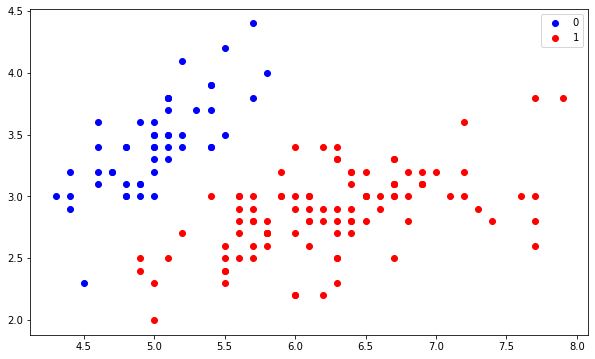

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='b', label='0')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='r', label='1')
plt.legend();

#### It seems that it can be differentiated using a Decision Boundary, now lets define our class.

In [ ]:
class LogisticRegression:
    
    # defining parameters such as learning rate, number ot iterations, whether to include intercept, 
    # and verbose which says whether to print anything or not like, loss etc.
    def __init__(self, learning_rate=0.01, num_iterations=50000, fit_intercept=True, verbose=False):
        self.learning_rate = learning_rate
        self.num_iterations = num_iterations
        self.fit_intercept = fit_intercept
        self.verbose = verbose
    
    # function to define the Incercept value.
    def __b_intercept(self, X):
        # initially we set it as all 1's
        intercept = np.ones((X.shape[0], 1))
        # then we concatinate them to the value of X, we don't add we just append them at the end.
        return np.concatenate((intercept, X), axis=1)
    
    def __sigmoid_function(self, z):
        # this is our actual sigmoid function which predicts our yp
        return 1 / (1 + np.exp(-z))
    
    def __loss(self, yp, y):
        # this is the loss function which we use to minimize the error of our model
        return (-y * np.log(yp) - (1 - y) * np.log(1 - yp)).mean()
    
    # this is the function which trains our model.
    def fit(self, X, y):
        
        # as said if we want our intercept term to be added we use fit_intercept=True
        if self.fit_intercept:
            X = self.__b_intercept(X)
        
        # weights initialization of our Normal Vector, initially we set it to 0, then we learn it eventually
        self.W = np.zeros(X.shape[1])
        
        # this for loop runs for the number of iterations provided
        for i in range(self.num_iterations):
            
            # this is our W * Xi
            z = np.dot(X, self.W)
            
            # this is where we predict the values of Y based on W and Xi
            yp = self.__sigmoid_function(z)
            
            # this is where the gradient is calculated form the error generated by our model
            gradient = np.dot(X.T, (yp - y)) / y.size
            
            # this is where we update our values of W, so that we can use the new values for the next iteration
            self.W -= self.learning_rate * gradient
            
            # this is our new W * Xi
            z = np.dot(X, self.W)
            yp = self.__sigmoid_function(z)
            
            # this is where the loss is calculated
            loss = self.__loss(yp, y)
            
            # as mentioned above if we want to print somehting we use verbose, so if verbose=True then our loss get printed
            if(self.verbose ==True and i % 10000 == 0):
                print(f'loss: {loss} \t')
    
    # this is where we predict the probability values based on out generated W values out of all those iterations.
    def predict_prob(self, X):
        # as said if we want our intercept term to be added we use fit_intercept=True
        if self.fit_intercept:
            X = self.__b_intercept(X)
        
        # this is the final prediction that is generated based on the values learned.
        return self.__sigmoid_function(np.dot(X, self.W))
    
    # this is where we predict the actual values 0 or 1 using round. anything less than 0.5 = 0 or more than 0.5 is 1
    def predict(self, X):
        return self.predict_prob(X).round()

#### Let us try creating a class of it, we will give Learning rate as 0.1  and number of iterations as 300000

In [ ]:
model = LogisticRegression(learning_rate=0.1, num_iterations=300000)

#### Now we will try to train our model.

In [ ]:
%%time
model.fit(X, y)

CPU times: user 13.1 s, sys: 26.2 ms, total: 13.1 s
Wall time: 13.1 s


#### Lets us see how well our prediction works

In [ ]:
preds = model.predict(X)
(preds == y).mean()

1.0

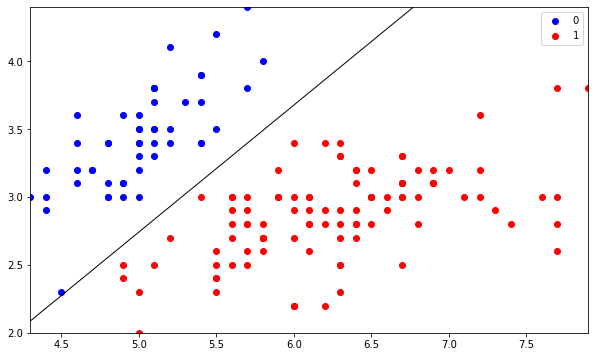

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='b', label='0')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='r', label='1')
plt.legend()
x1_min, x1_max = X[:,0].min(), X[:,0].max(),
x2_min, x2_max = X[:,1].min(), X[:,1].max(),
xx1, xx2 = np.meshgrid(np.linspace(x1_min, x1_max), np.linspace(x2_min, x2_max))
grid = np.c_[xx1.ravel(), xx2.ravel()]
probs = model.predict_prob(grid).reshape(xx1.shape)
plt.contour(xx1, xx2, probs, [0.5], linewidths=1, colors='black');

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y, model.predict(X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       1.00      1.00      1.00       100

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



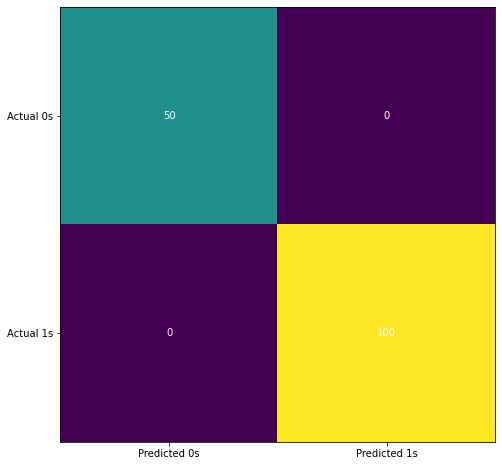

In [ ]:
cm = confusion_matrix(y, model.predict(X))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='white')
plt.show()

# Implementing Logistic Regression from Scikit-Learn

#### Either you can choose to do all those coding yourself, or what you can do is just import a class form a phenominal library of python called Scikit-Learn, and use it's pre implemented Logistic Regression

In [ ]:

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
model = LogisticRegression(solver='liblinear', random_state=0)


#### It also has the same method as fit to train the model

In [ ]:
model.fit(X, y)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

#### Let us try to predict, and check the value of its prediction.

In [ ]:
model.predict_proba(X)

array([[8.90851839e-01, 1.09148161e-01],
       [6.45187510e-01, 3.54812490e-01],
       [8.69400222e-01, 1.30599778e-01],
       [8.51288377e-01, 1.48711623e-01],
       [9.39818917e-01, 6.01810828e-02],
       [9.50364297e-01, 4.96357033e-02],
       [9.49998814e-01, 5.00011855e-02],
       [8.75288203e-01, 1.24711797e-01],
       [8.08902352e-01, 1.91097648e-01],
       [7.30634124e-01, 2.69365876e-01],
       [8.95888506e-01, 1.04111494e-01],
       [9.20303724e-01, 7.96962761e-02],
       [6.99920244e-01, 3.00079756e-01],
       [8.90098824e-01, 1.09901176e-01],
       [9.13422567e-01, 8.65774329e-02],
       [9.85294062e-01, 1.47059381e-02],
       [9.50364297e-01, 4.96357033e-02],
       [8.90851839e-01, 1.09148161e-01],
       [8.58798284e-01, 1.41201716e-01],
       [9.64399433e-01, 3.56005674e-02],
       [7.21654128e-01, 2.78345872e-01],
       [9.47809512e-01, 5.21904883e-02],
       [9.76891959e-01, 2.31080409e-02],
       [7.85782889e-01, 2.14217111e-01],
       [9.203037

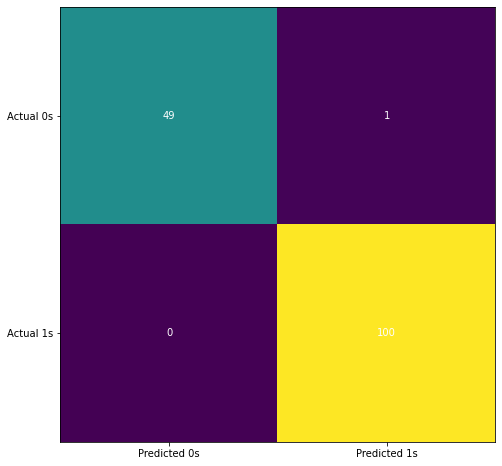

In [ ]:
cm = confusion_matrix(y, model.predict(X))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='white')
plt.show()


In [ ]:
print(classification_report(y, model.predict(X)))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        50
           1       0.99      1.00      1.00       100

    accuracy                           0.99       150
   macro avg       1.00      0.99      0.99       150
weighted avg       0.99      0.99      0.99       150



#### The code is reference from this phenominal github page : https://github.com/martinpella/logistic-reg/blob/master/logistic_reg.ipynb
